In [1]:
import pandas as pd
import numpy as np
import os
import openpyxl
import matplotlib.pyplot as plt
from datetime import datetime
from sklearn.linear_model import LinearRegression
from statsmodels.tsa.seasonal import seasonal_decompose
import plotly.graph_objects as go
from plotly.subplots import make_subplots
from prophet import Prophet
import plotly.express as px

In [2]:
url="/home/anamaria/code/nusero92/aviation/avia_paodis__custom_9158704_spreadsheet.xlsx"
int_rj=pd.ExcelFile(url)
sheet_names_int_rj = int_rj.sheet_names[78:84]
dfs_int_rj = [int_rj.parse(sheet_name) for sheet_name in sheet_names_int_rj]
dfs_int_rj

[                   Country     2013     2014     2015     2016     2017  \
 0                  Belgium   208536   219827   228188   183516   131588   
 1                 Bulgaria       36      102        0        0      184   
 2                  Czechia    72129    54512    56323    50619    58354   
 3                  Denmark   240856   283917   202870   149107   174640   
 4                  Germany  1615817  1756543  1674757  1612912  1275927   
 5                  Estonia        0    18839    41047    59891    63343   
 6                  Ireland     1774     2050     2119     1338      902   
 7                   Greece        0      178       13       28       93   
 8                    Spain       24       41      239     1509     1482   
 9                   France   133131   127924   105618    41502    35608   
 10                 Croatia    47080    36525    43234    32530     9528   
 11                   Italy   264943   283815   233385   198243   168818   
 12         

In [3]:
base_int_rj = dfs_int_rj[0]

try:
    # Loop through the rest of the DataFrames and join them one by one, using sheet names as suffixes
    for i, df in enumerate(dfs_int_rj[1:], start=1):  # Start at 1 to include all but the first df
        # Use the sheet name for the suffix. Ensure it's a valid string that can be used as a suffix.
        # For example, replace spaces with underscores if necessary
        sheet_name_suffix_rj = sheet_names_int_rj[i].replace(' ', '_')
        suffixes_rj = ('', f'_{sheet_name_suffix_rj}')  # Custom suffix for each joined DataFrame
        
        # Perform the merge operation and update base_df_all_ac each time
        base_int_rj = pd.merge(base_int_rj, df, on='Country', how='outer', suffixes=suffixes_rj)
except Exception as e:
    print(f"An error occurred: {e}")

In [4]:
base_int_rj.columns

Index(['Country', '2013', '2014', '2015', '2016', '2017', '2018', '2019',
       '2020', '2021', '2022', '2013_int-rj-300-499km',
       '2014_int-rj-300-499km', '2015_int-rj-300-499km',
       '2016_int-rj-300-499km', '2017_int-rj-300-499km',
       '2018_int-rj-300-499km', '2019_int-rj-300-499km',
       '2020_int-rj-300-499km', '2021_int-rj-300-499km',
       '2022_int-rj-300-499km', '2013_int-rj-500-999km',
       '2014_int-rj-500-999km', '2015_int-rj-500-999km',
       '2016_int-rj-500-999km', '2017_int-rj-500-999km',
       '2018_int-rj-500-999km', '2019_int-rj-500-999km',
       '2020_int-rj-500-999km', '2021_int-rj-500-999km',
       '2022_int-rj-500-999km', '2013_int.rj-1000-1499km',
       '2014_int.rj-1000-1499km', '2015_int.rj-1000-1499km',
       '2016_int.rj-1000-1499km', '2017_int.rj-1000-1499km',
       '2018_int.rj-1000-1499km', '2019_int.rj-1000-1499km',
       '2020_int.rj-1000-1499km', '2021_int.rj-1000-1499km',
       '2022_int.rj-1000-1499km', '2013_int-rj-1500-20

In [5]:
base_int_rj=base_int_rj.replace(":", 0)

In [6]:
base_int_rj_melt=pd.melt(base_int_rj, id_vars=["Country"], var_name="Year_Dist", value_name="Value")
base_int_rj_melt[['Year', 'Distance']] = base_int_rj_melt["Year_Dist"].str.extract(r'(\d{4})(?:_int-rj(.*))?')
base_int_rj_melt=base_int_rj_melt.fillna("<300 km")

In [7]:
base_int_rj_melt['Year'] = pd.to_numeric(base_int_rj_melt['Year'])
base_int_rj_melt['Value'] = pd.to_numeric(base_int_rj_melt['Value'], errors='coerce')

In [8]:
base_int_rj_melt.isna().sum()

Country      0
Year_Dist    0
Value        0
Year         0
Distance     0
dtype: int64

In [21]:
base_int_rj_melt[250:270]

,Country,Year_Dist,Value,Year,Distance
250,Serbia,2019,264190,2019,<300 km
251,Türkiye,2019,0,2019,<300 km
252,Belgium,2020,46634,2020,<300 km
253,Bulgaria,2020,31,2020,<300 km
254,Czechia,2020,12892,2020,<300 km
255,Denmark,2020,49028,2020,<300 km
256,Germany,2020,363637,2020,<300 km
257,Estonia,2020,14070,2020,<300 km
258,Ireland,2020,58,2020,<300 km
259,Greece,2020,16,2020,<300 km


In [22]:
def plot_distance_relevance_for_each_country(df):
    """
    Plots the relevance of each distance type for each country in the DataFrame.
    
    Parameters:
    - df: DataFrame containing 'country', 'value', 'year', and 'distance' columns.
    """
    countries = df['Country'].unique()  # Get the list of unique countries
    
    for country in countries:
        # Filter the DataFrame for the current country
        country_df = df[df['Country'] == country]
        
        # Aggregate values by distance
        agg_data = country_df.groupby('Distance').agg({'Value': 'sum'}).reset_index()
        
        # Create a bar chart for the aggregated data
        fig = px.bar(agg_data,
                     x='Distance',
                     y='Value',
                     title=f'Passenger Distribution by Distance Type for {country}',
                     labels={'value': 'Total Value', 'distance': 'Distance Category'},
                     text='Value')
        
        # Customize the plot appearance
        fig.update_traces(texttemplate='%{text:.2s}', textposition='outside')
        fig.update_layout(uniformtext_minsize=8, uniformtext_mode='hide',
                          xaxis_tickangle=-45,  # Rotate labels for better readability
                          xaxis_title="Distance Category",
                          yaxis_title="Total Value",
                          plot_bgcolor="white")
        
        fig.show()

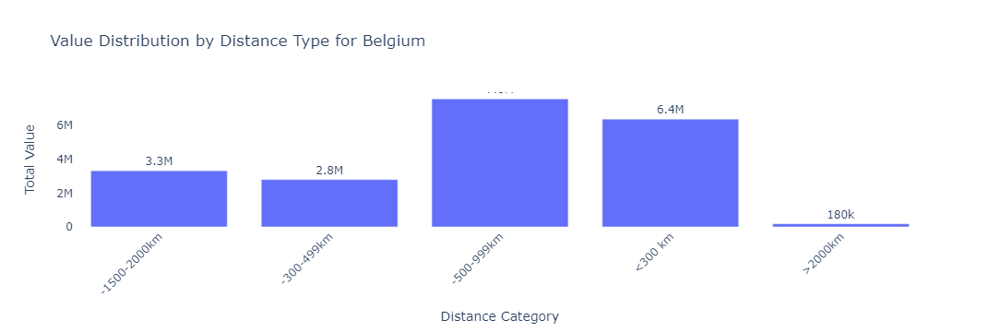

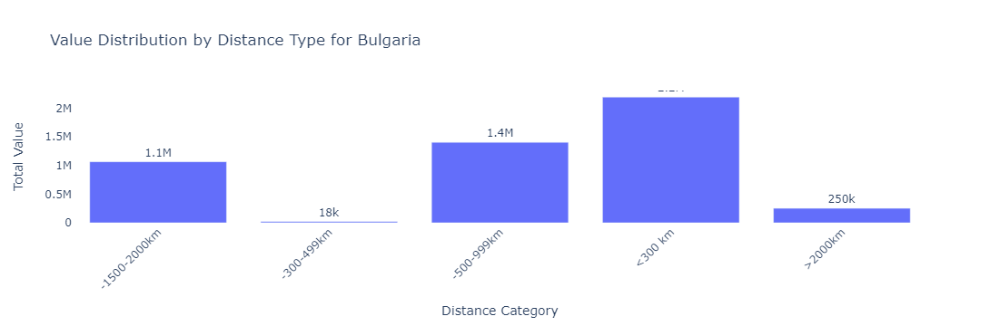

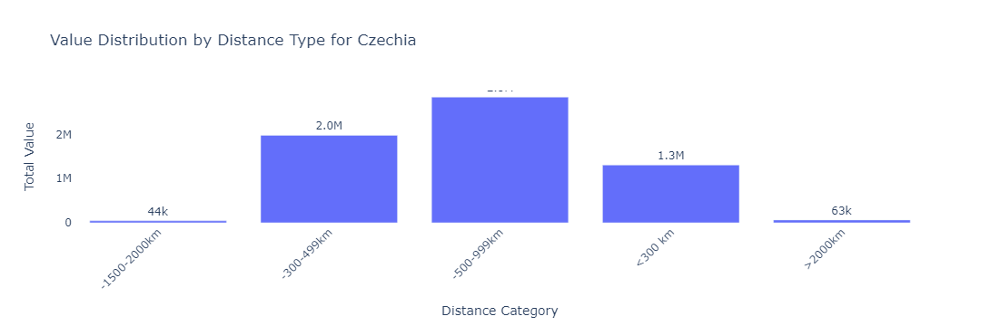

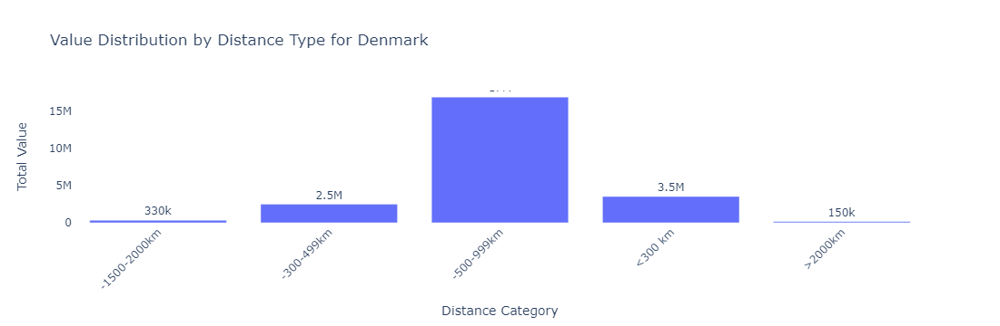

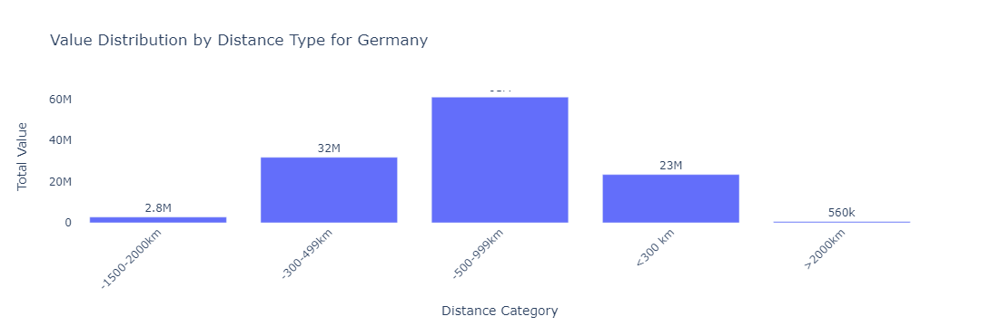

...

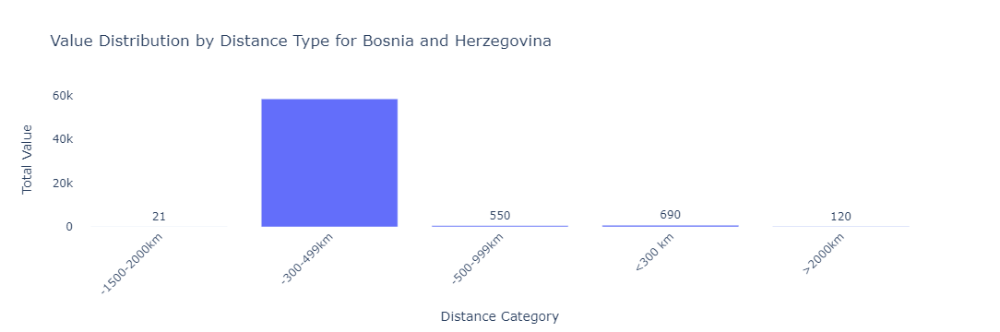

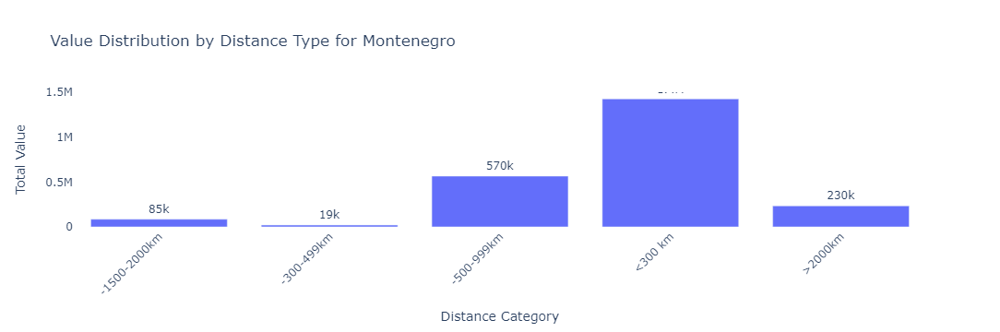

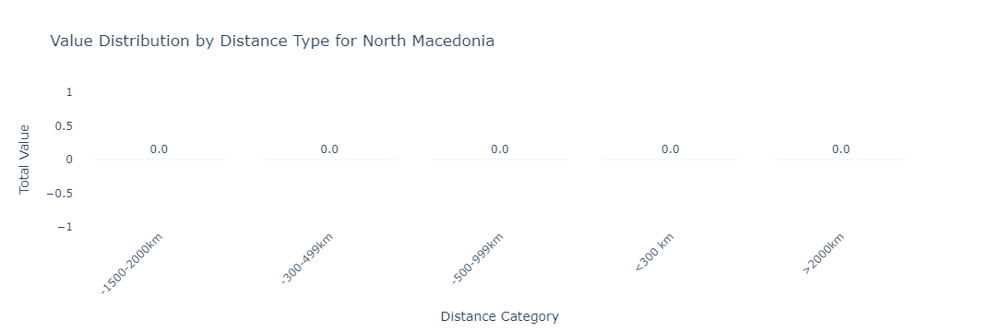

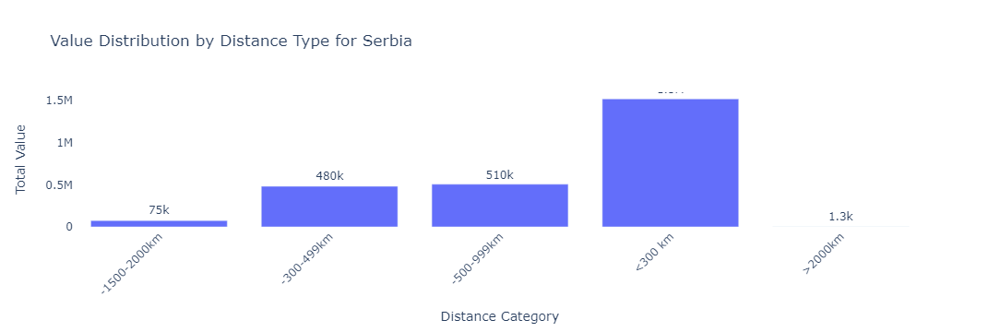

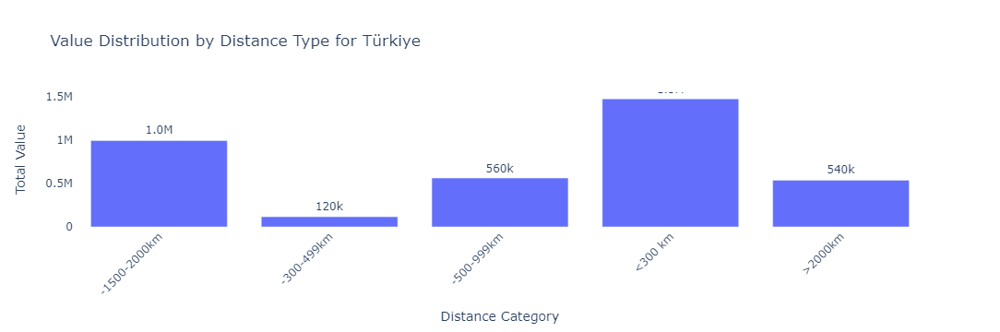

In [11]:
plot_distance_relevance_for_each_country(base_int_rj_melt)

In [12]:
def find_most_used_distance_by_country(df):
    """
    Finds the most used distance for each country based on the maximum aggregated value.
    
    Parameters:
    - df: DataFrame containing 'country', 'value', 'year', and 'distance' columns.
    
    Returns:
    - A DataFrame with each country and its most used distance type.
    """
    # Step 1: Aggregate values by country and distance
    agg_df = df.groupby(['Country', 'Distance'])['Value'].sum().reset_index()
    
    # Step 2: Find the distance with the maximum value for each country
    most_used_distances = agg_df.loc[agg_df.groupby('Country')['Value'].idxmax()]
    
    # Optional: Sort by country name for better readability
    most_used_distances.sort_values(by='Country', inplace=True)
    
    # Step 3: Create a list (or DataFrame) with country and its most used distance
    # If you prefer a list of tuples: [(country, distance), ...]
    most_used_list = list(zip(most_used_distances['Country'], most_used_distances['Distance']))
    
    return most_used_distances[['Country', 'Distance']]

In [13]:
most_used_distance_by_country_df = find_most_used_distance_by_country(base_int_rj_melt)

In [14]:
most_used_distance_by_country_df

,Country,Distance
2,Austria,-500-999km
7,Belgium,-500-999km
11,Bosnia and Herzegovina,-300-499km
18,Bulgaria,<300 km
23,Croatia,<300 km
26,Cyprus,-300-499km
32,Czechia,-500-999km
37,Denmark,-500-999km
42,Estonia,-500-999km
45,Finland,-1500-2000km


In [15]:
most_used_list = most_used_distance_by_country_df.values.tolist()
print(most_used_list)

[['Austria', '-500-999km'], ['Belgium', '-500-999km'], ['Bosnia and Herzegovina', '-300-499km'], ['Bulgaria', '<300 km'], ['Croatia', '<300 km'], ['Cyprus', '-300-499km'], ['Czechia', '-500-999km'], ['Denmark', '-500-999km'], ['Estonia', '-500-999km'], ['Finland', '-1500-2000km'], ['France', '-500-999km'], ['Germany', '-500-999km'], ['Greece', '<300 km'], ['Hungary', '-500-999km'], ['Iceland', '-1500-2000km'], ['Ireland', '-500-999km'], ['Italy', '-500-999km'], ['Latvia', '-500-999km'], ['Lithuania', '-500-999km'], ['Luxembourg', '-300-499km'], ['Malta', '<300 km'], ['Montenegro', '<300 km'], ['Netherlands', '-500-999km'], ['North Macedonia', '-1500-2000km'], ['Norway', '-500-999km'], ['Poland', '-500-999km'], ['Portugal', '<300 km'], ['Romania', '-500-999km'], ['Serbia', '<300 km'], ['Slovakia', '-300-499km'], ['Slovenia', '-500-999km'], ['Spain', '<300 km'], ['Sweden', '-500-999km'], ['Switzerland', '-500-999km'], ['Türkiye', '<300 km'], ['United Kingdom', '-500-999km']]


In [16]:
def predict_and_plot_for_distance_types_5_years(df):
    results = []
    countries = df['Country'].unique()
    distance_types = df['Distance'].dropna().unique()

    for country in countries:
        for distance in distance_types:
            subset = df[(df['Country'] == country) & (df['Distance'] == distance)]
            
            if len(subset) > 1:
                X = subset['Year'].values.reshape(-1, 1)  # Ensure it's a 2D array
                y = subset['Value'].values
                
                model = LinearRegression()
                model.fit(X, y)
                
                # Generating future years for prediction
                last_year = X.max()
                future_years = np.array([[year] for year in range(last_year + 1, last_year + 6)])
                predictions = model.predict(future_years)
                
                # Store results
                for year, pred in zip(future_years.flatten(), predictions.flatten()):
                    results.append({'Country': country, 'Distance': distance, 'Year': year, 'predicted_value': pred})
                
                # Plotting
                fig = go.Figure()
                # Plot actual data
                fig.add_trace(go.Scatter(x=subset['Year'], y=y, mode='markers+lines', name='Actual'))
                # Plot predictions
                fig.add_trace(go.Scatter(x=future_years.flatten(), y=predictions.flatten(), mode='markers+lines', name='Predicted', line=dict(dash='dash')))
                
                fig.update_layout(title=f'Prediction for {country} - {distance} for the Next 5 Years',
                                  xaxis_title='Year',
                                  yaxis_title='Value',
                                  legend_title='Type',
                                  template="plotly_white")
                fig.show()
                
    return pd.DataFrame(results)

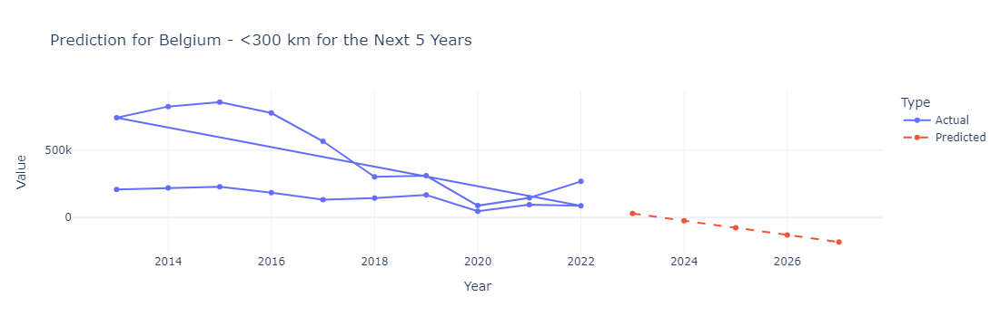

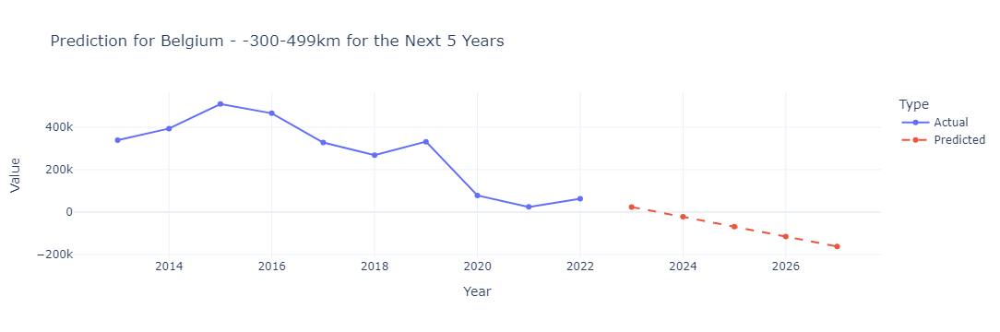

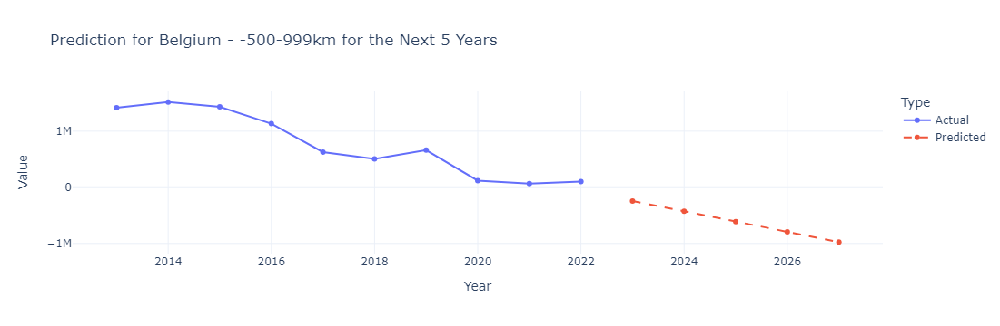

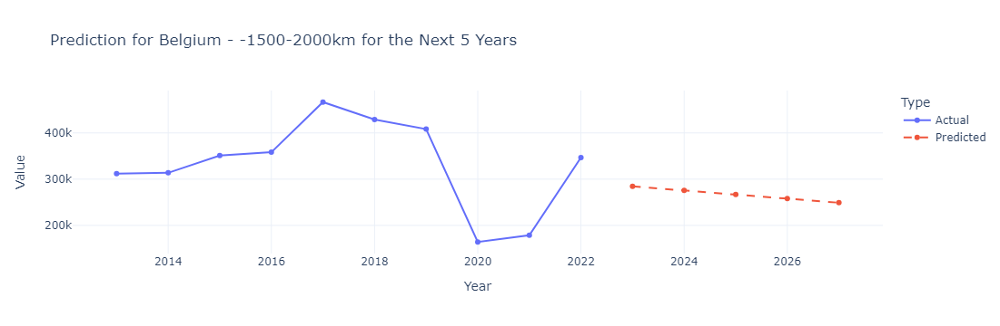

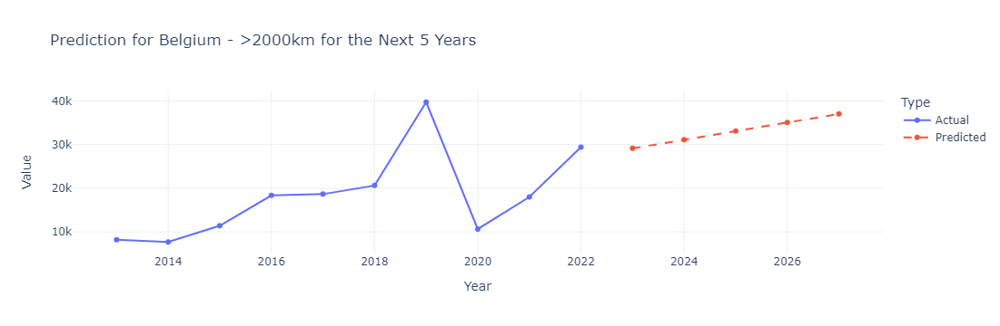

...

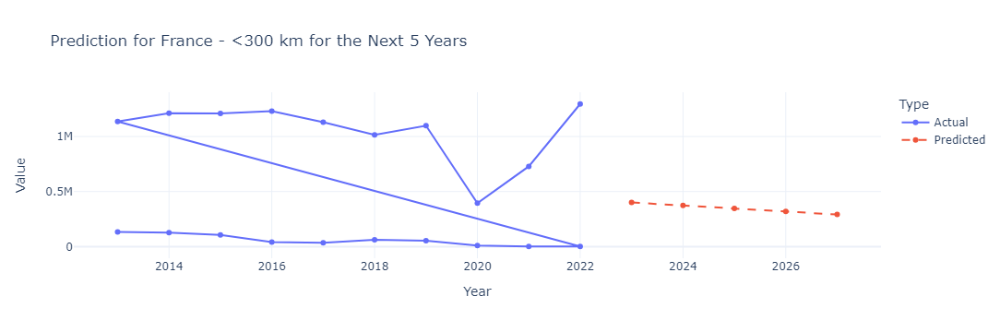

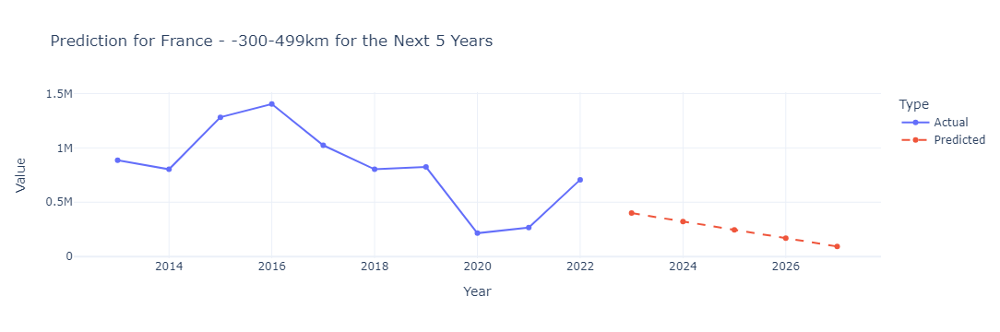

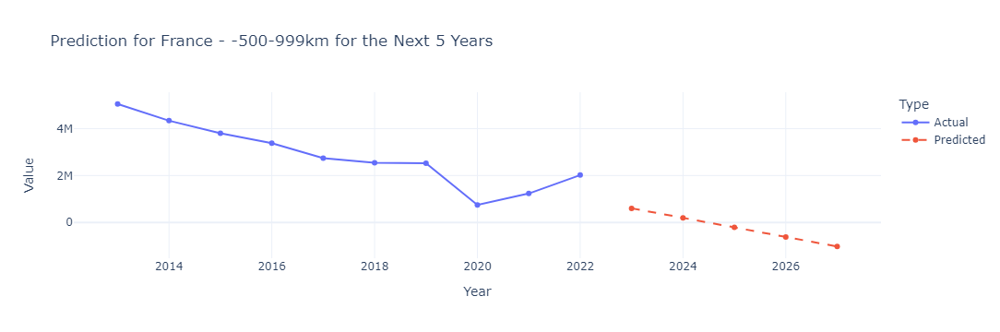

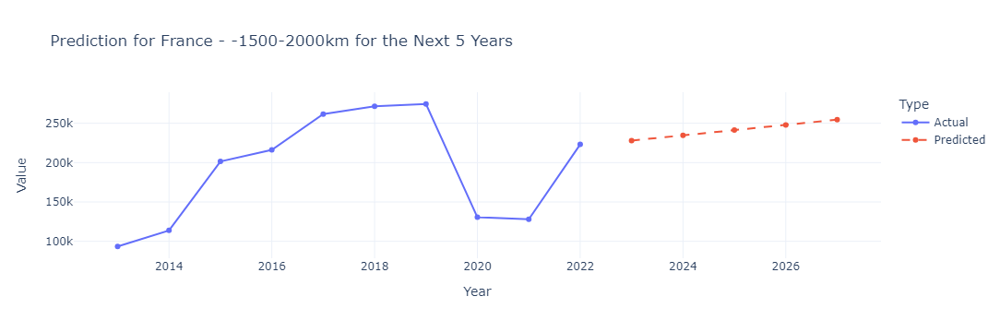

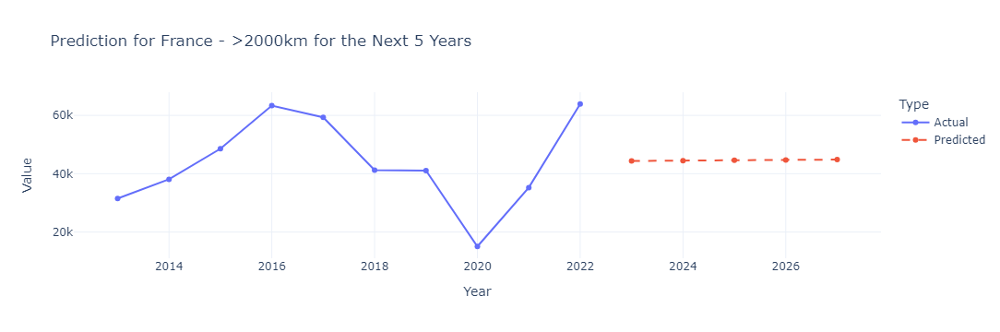

In [17]:
prediction_results = predict_and_plot_for_distance_types_5_years(base_int_rj_melt)